In [220]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from scipy import stats
%matplotlib inline

In [232]:
df = pd.read_csv('cleaned_data.csv')

In [240]:
#value counts of meds
df['insulin'].value_counts()

not_prescribed      46495
no_change_dosage    29902
dosage_decreased    12039
dosage_increased    11056
Name: insulin, dtype: int64

In [241]:
df['metformin'].value_counts()

not_prescribed      79971
no_change_dosage    17920
dosage_increased     1039
dosage_decreased      562
Name: metformin, dtype: int64

In [242]:
df['nateglinide'].value_counts()


not_prescribed      98796
no_change_dosage      662
dosage_increased       23
dosage_decreased       11
Name: nateglinide, dtype: int64

In [243]:
df['repaglinide'].value_counts()

not_prescribed      97963
no_change_dosage     1375
dosage_increased      109
dosage_decreased       45
Name: repaglinide, dtype: int64

In [244]:
df['glipizide'].value_counts()

not_prescribed      87093
no_change_dosage    11101
dosage_increased      754
dosage_decreased      544
Name: glipizide, dtype: int64

In [245]:
df['glyburide'].value_counts()

not_prescribed      89113
no_change_dosage     9039
dosage_increased      794
dosage_decreased      546
Name: glyburide, dtype: int64

In [246]:
df['tolbutamide'].value_counts()

not_prescribed      99470
no_change_dosage       22
Name: tolbutamide, dtype: int64

In [247]:
df['pioglitazone'].value_counts()

not_prescribed      92316
no_change_dosage     6829
dosage_increased      230
dosage_decreased      117
Name: pioglitazone, dtype: int64

In [248]:
df['citoglipton'].value_counts()

not_prescribed    99492
Name: citoglipton, dtype: int64

In [249]:
df['metformin_rosiglitazone'].value_counts()

not_prescribed    99492
Name: metformin_rosiglitazone, dtype: int64

In [250]:
df['examide'].value_counts()

not_prescribed    99492
Name: examide, dtype: int64

In [251]:
df['metformin_pioglitazone'].value_counts()

not_prescribed      99491
no_change_dosage        1
Name: metformin_pioglitazone, dtype: int64

In [252]:
df['glimepiride_pioglitazone'].value_counts()

not_prescribed      99491
no_change_dosage        1
Name: glimepiride_pioglitazone, dtype: int64

In [253]:
df['glipizide_metformin'].value_counts()

not_prescribed      99479
no_change_dosage       13
Name: glipizide_metformin, dtype: int64

In [254]:
df['acetohexamide'].value_counts()

not_prescribed      99491
no_change_dosage        1
Name: acetohexamide, dtype: int64

In [255]:
df['miglitol'].value_counts()

not_prescribed      99454
no_change_dosage       31
dosage_decreased        5
dosage_increased        2
Name: miglitol, dtype: int64

In [256]:
df['acarbose'].value_counts()

not_prescribed      99190
no_change_dosage      289
dosage_increased       10
dosage_decreased        3
Name: acarbose, dtype: int64

In [271]:
#drugs that had every value not_prescribed where dropped as every value in binary would be 0
#and would have no significance. Also dropped meds that no_change, dosage incr or decr was 1. 
df = df.drop(['citoglipton','examide'], axis=1)

In [258]:
#drop unnamed
df = df.drop(['Unnamed: 0'], axis=1)

In [259]:
df = df.drop(['metformin_rosiglitazone' ], axis =1)


In [260]:
# replacing string in to binary
df = pd.read_csv('cleaned_data.csv')
df['change_in_meds'] = df['change_in_meds'].replace('Ch', 1)
df['change_in_meds'] = df['change_in_meds'].replace('No', 0)

In [261]:
# replacing string in to binary
df['diabates_med_prescribed'] = df['diabates_med_prescribed'].replace('No', 0)
df['diabates_med_prescribed'] = df['diabates_med_prescribed'].replace('Yes', 1)
df['gender'] = df['gender'].replace('Male', 0)
df['gender'] = df['gender'].replace('Female', 1)

#replace age code intervals 0- 10: 1, 10-20:2 etc
for i in range (0,10):
    df['age']=df['age'].replace('['+str(10*i)+ '-' +str(10*(i+1))+')', i+1)

In [262]:
#convert string to binary with 0 and 1 only either readmitted or not regardless of days
df['readmitted'] = df['readmitted'].replace('NO', 0)
df['readmitted'] = df['readmitted'].replace('<30', 1)
df['readmitted'] = df['readmitted'].replace('>30', 1)

In [263]:
#replacing strings to numeric for the med values
meds = ['metformin', 'nateglinide', 'chlorpropamide', 'glimepiride',
         'glipizide','repaglinide','glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone',
        'acarbose', 'miglitol', 'troglitazone','tolazamide','insulin',  'glyburide_metformin', 'glimepiride_pioglitazone',
        'glipizide_metformin', 'acetohexamide' 
        ]

for col in meds:
    df[col]=df[col].replace('not_prescribed', 0)
    df[col]=df[col].replace('no_change_dosage', 0)
    df[col]=df[col].replace('dosage_increased', 1)
    df[col]=df[col].replace('dosage_decreased', 1)

In [264]:
#count of certain medicines to see if have different values if not then drop if all 0
df['glimepiride_pioglitazone'].value_counts()

0    99492
Name: glimepiride_pioglitazone, dtype: int64

In [265]:
df['glipizide_metformin'].value_counts()

0    99492
Name: glipizide_metformin, dtype: int64

In [266]:
df['acetohexamide'].value_counts()

0    99492
Name: acetohexamide, dtype: int64

In [37]:
df['glimepiride_pioglitazone'].value_counts()

0    99492
Name: glimepiride_pioglitazone, dtype: int64

In [47]:
df['metformin_rosiglitazone'].value_counts()

not_prescribed    99492
Name: metformin_rosiglitazone, dtype: int64

In [267]:
#thes above will also be dropped
df =df.drop(['metformin_pioglitazone', 'glimepiride_pioglitazone', 'acetohexamide'], axis =1)

In [268]:
df =df.drop(['metformin_rosiglitazone'], axis =1)

In [274]:
df =df.drop(['glipizide_metformin'], axis =1)

In [277]:
df =df.drop(['tolbutamide',], axis =1)

In [269]:
#replacing string race to numeric
column_names1 =['race']
new_values = {'AfricanAmerican': 0, 'Asian':1, 'Caucasian': 3, 'Hispanic': 4, 'Other': 5 }
for medicine in column_names1:
    df[medicine] = df[medicine].replace(new_values)

In [276]:
#check all values are numeric
df.head(5)

,Unnamed: 0,race,gender,age,days_in_hospital,num_lab_procedures,num_not_lab_procedures,num_current_medications,num_outpatient_appointments,num_previous_emergencies,...,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide_metformin,change_in_meds,diabates_med_prescribed,readmitted
0,0,3,1,1,1,41,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,3,1,2,3,59,0,18,0,0,...,0,0,0,0,0,1,0,1,1,1
2,2,0,1,3,2,11,5,13,2,0,...,0,0,0,0,0,0,0,0,1,0
3,3,3,0,4,2,44,1,16,0,0,...,0,0,0,0,0,1,0,1,1,0
4,4,3,0,5,1,51,0,8,0,0,...,0,0,0,0,0,0,0,1,1,0


In [55]:
#train model
from sklearn.model_selection import train_test_split
X = df.drop('readmitted', axis = 1)
y = df.readmitted
#train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [60]:
#Random Forest
#no tuning hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [70]:
#accuracy of testing model
rfc.score(X_test,y_test)


0.605256545555053

In [212]:
#Random Forest classifier with tuning hyperparameters
#Hyperparmameters that make model better were n_estimators, min_samles_leaf and max_features
#We used 500 decision trees in the end as
#found using less or more didn't improve the accuracy and 500 was the ideal number tried 100 to 500 increments of 50
#min_samples_leaf found as 5 to be our ideal number
# max_features in each tree uses 5 features and helps reduces overfitting
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators = 500,  max_features=5, min_samples_leaf=5, random_state =42, n_jobs =-1 )
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [213]:
rfc.score(X_test,y_test)


0.6227448615508318

In [167]:
#with tuning the accuracy increased from 0.60 to 0.62
test_score = accuracy_score(y_test, rfc.predict(X_test)) * 100
train_score = accuracy_score(y_train, rfc.predict(X_train)) * 100



In [168]:
#printing models as a percentage
print(train_score)
print(test_score)


74.04043069114118
62.274486155083174


In [109]:
# PREDICTING y_test values.
rfc_predict=rfc.predict(X_test) 
rfc_predict

array([0, 0, 1, ..., 0, 0, 1])

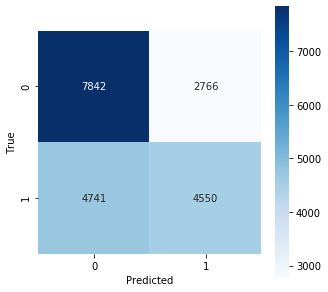

In [214]:
#confusion matrix to vizualize performance of the algorithm
from sklearn.metrics import confusion_matrix
ypred = rfc.predict(X_test)
cm = confusion_matrix(y_test, ypred)
fig_size = plt.subplots(figsize=(5,5)) 
sns.heatmap(cm, square=True, annot=True,cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True');

In [113]:
#summary of prediction results
from sklearn.metrics import classification_report
rfc_pred= rfc.predict(X_test)
print(confusion_matrix(y_test,rfc_pred))
print('\n')
print(classification_report(y_test,rfc_pred))

[[7842 2766]
 [4741 4550]]


              precision    recall  f1-score   support

           0       0.62      0.74      0.68     10608
           1       0.62      0.49      0.55      9291

    accuracy                           0.62     19899
   macro avg       0.62      0.61      0.61     19899
weighted avg       0.62      0.62      0.62     19899



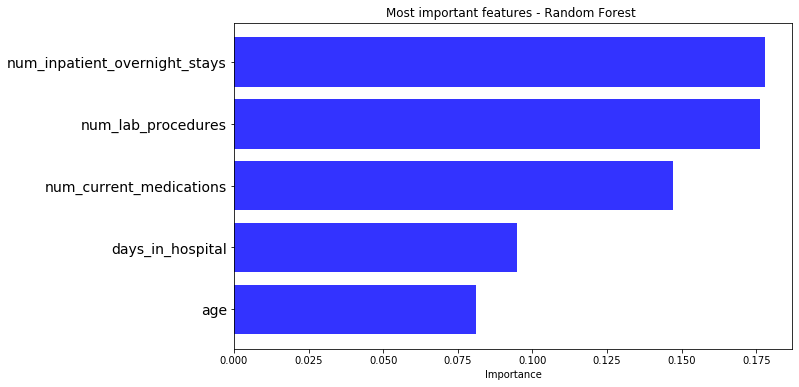

In [114]:
#visualisation of RF impoortant features
# Random Forest feature selection
from sklearn.feature_selection import SelectFromModel
feature_names = X_train.columns
feature_imports = rfc.feature_importances_
most_imp_features = pd.DataFrame([f for f in zip(feature_names,feature_imports)], columns=["Feature", "Importance"]).nlargest(5, "Importance")
most_imp_features.sort_values(by="Importance", inplace=True)
plt.figure(figsize=(10,6))
plt.barh(range(len(most_imp_features)), most_imp_features.Importance, align='center', alpha=0.8, color = 'b')
plt.yticks(range(len(most_imp_features)), most_imp_features.Feature, fontsize=14)
plt.xlabel('Importance')
plt.title('Most important features - Random Forest ')
plt.show()

# code from https://www.kaggle.com/iabhishekofficial/prediction-on-hospital-readmission


In [177]:
#visualise decision tree used in the random forest

#code inspiration from https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c

#from sklearn.tree import DecisionTreeClassifier
#model = DecisionTreeClassifier(max_depth =5)
#model.fit(X, y)

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=10)
model.fit(X, y)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [225]:
#This function generates a GraphViz representation of the decision tree, which is then written into out_file. 
#Once exported, graphical renderings can be generated 
from sklearn.tree import export_graphviz 

model = RandomForestClassifier(n_estimators=5, max_depth =5)
model.fit(X_train, y_train)
model.fit(X_test, y_test)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=5, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [203]:
#extract a single tree
estimator = model.estimators_[1]
feature_names = [i for i in X_train.columns]

y_train_str = y_train.astype('str')
y_train_str[y_train_str == '0'] = 'not readmitted'
y_train_str[y_train_str == '1'] = 'readmitted'
y_train_str = y_train_str.values

export_graphviz(estimator, out_file='tree.dot',
 feature_names = feature_names,
 class_names = y_train_str,
 rounded = True, proportion = True,
 label='root',
 precision = 2, filled = True)

# convert .dot to .png stored in users files as diabetes.png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'diabetes.png', '-Gdpi=600'])

#displays in jupyter
from IPython.display import Image
Image(filename = 'diabetes.png') 


In [227]:
#extract a single tree
estimator = model.estimators_[1]
feature_names = [i for i in X_train.columns]

y_test_str = y_test.astype('str')
y_test_str[y_test_str == '0'] = 'not readmitted'
y_test_str[y_test_str == '1'] = 'readmitted'
y_test_str = y_test_str.values

export_graphviz(estimator, out_file='tree.dot',
 feature_names = feature_names,
 class_names = y_test_str,
 rounded = True, proportion = True,
 label='root',
 precision = 2, filled = True)

# convert .dot to .png stored in users files as diabetes.png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'diabetestest.png', '-Gdpi=600'])

#displays in jupyter
from IPython.display import Image
Image(filename = 'diabetestest.png') 